# Sample 15arc-sec GEBCO_2023.nc on OM4p25 grid

## Apply edits to the topography.

## Region 16: 0,30,-50,10,

In [1]:
# Notebook editor: John Krasting

# This notebook originated from Stephen Griffies, with many other contributors:
# Stephen.Griffies
# Alistair.Adcroft
# Robert.Hallberg
# Niki.Zadeh
# Raphael.Dussin

In [2]:
Region_Boundaries = [0,30,-50,10]
Region_Name = '16: Northern Tropical Atlantic'

In [3]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import netCDF4
import xarray as xr
import cmocean
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import sys
sys.path.insert(1, './tools/')
from topo_tools import *

Resolution = 240 cells/degree
GEBCO loaded with (nj,ni) =  (43200, 86400)  min(lon) =  -300.0  max(lon) =  60.0


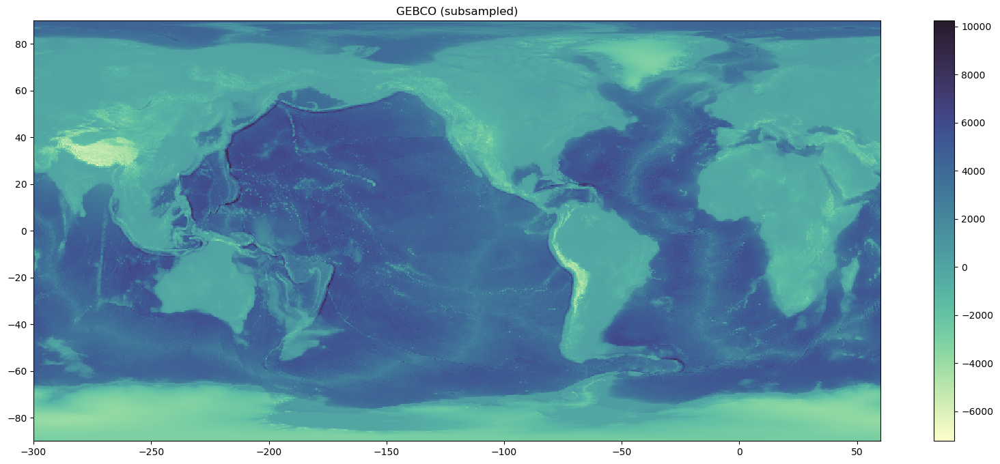

In [4]:
# GEBCO-2020 + Bedmachine combined topography 

fname_gebco  = "/archive/gold/datasets/topography/GEBCO_2023/GEBCO_2023.nc"

GEBCO = GEBCO_data(fname_gebco)

plt.figure(figsize=(20,8))
plt.pcolormesh(GEBCO.lonq[::100], GEBCO.latq[::100], GEBCO.depth[::100,::100], cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('GEBCO (subsampled)');

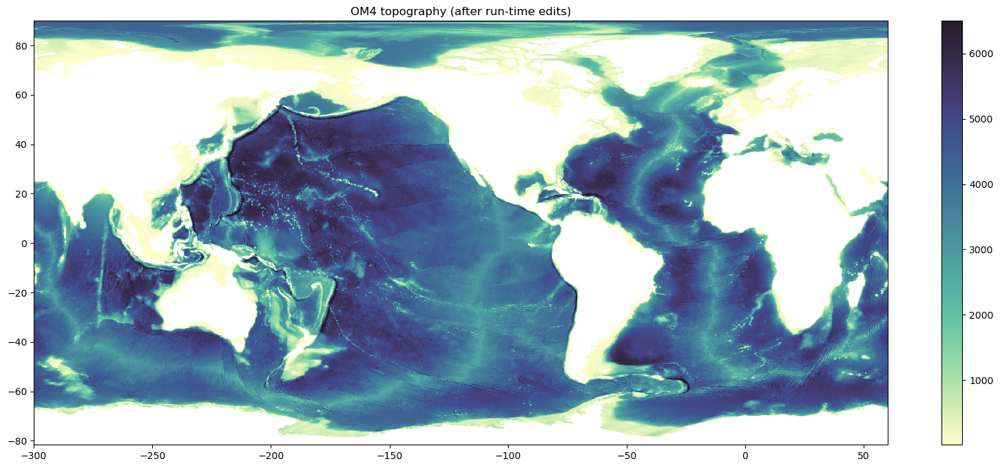

In [5]:
OM4 = OM4_data('/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_hgrid.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_static.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_mask.nc')
plt.figure(figsize=(20,8))
plt.pcolormesh(OM4.lonq, OM4.latq, OM4.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM4 topography (after run-time edits)');

OM5 longitudes are inconsistent!
OM5 latitudes are inconsistent!


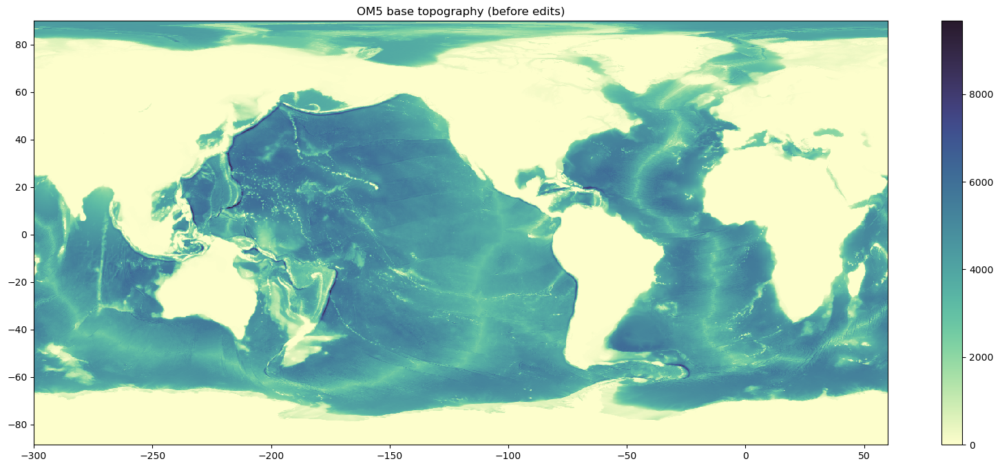

In [6]:
OM5 = OM5_data('/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_hgrid.nc',
               '/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_topog_merged.nc')

plt.figure(figsize=(20,8))
plt.pcolormesh(OM5.lonq, OM5.latq, OM5.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM5 base topography (before edits)');

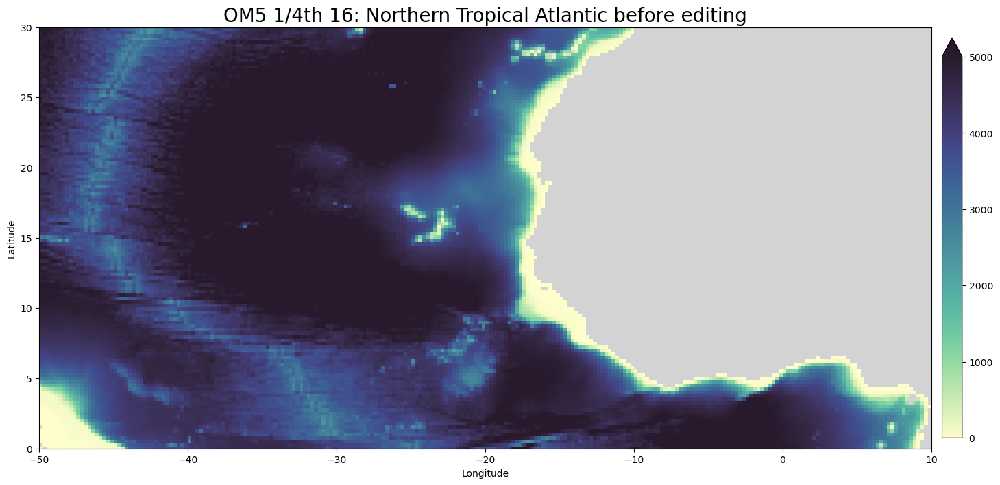

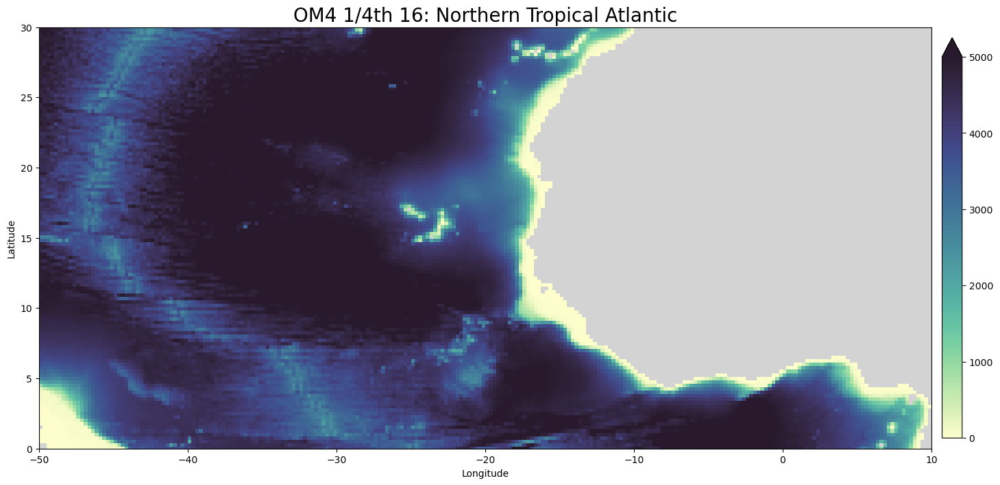

In [7]:
# Broad view of region before edits 

broadview(OM4,OM5,
          (Region_Boundaries[2],Region_Boundaries[3]),
          (Region_Boundaries[0],Region_Boundaries[1]),
          0, 5000, Region_Name, om4=True, new=False)

(-45.0, 10.0)
Gebco (js:je,is:ie) = 21599:25199,59999:62399
OM4 model (js:je,is:ie) = 502:565,998:1040
OM5 model (js:je,is:ie) = 583:646,998:1040
Using xlim = (-50.0, -40.0) ylim = (0.0, 15.0)
(-45.0, 10.0)
Gebco (js:je,is:ie) = 25199:28799,59999:62399
OM4 model (js:je,is:ie) = 563:630,998:1040
OM5 model (js:je,is:ie) = 644:711,998:1040
Using xlim = (-50.0, -40.0) ylim = (15.0, 30.0)
(-35.0, 10.0)
Gebco (js:je,is:ie) = 21599:25199,62399:64799
OM4 model (js:je,is:ie) = 502:565,1038:1080
OM5 model (js:je,is:ie) = 583:646,1038:1080
Using xlim = (-40.0, -30.0) ylim = (0.0, 15.0)
(-35.0, 10.0)
Gebco (js:je,is:ie) = 25199:28799,62399:64799
OM4 model (js:je,is:ie) = 563:630,1038:1080
OM5 model (js:je,is:ie) = 644:711,1038:1080
Using xlim = (-40.0, -30.0) ylim = (15.0, 30.0)
(-25.0, 10.0)
Gebco (js:je,is:ie) = 21599:25199,64799:67199
OM4 model (js:je,is:ie) = 502:565,1078:1120
OM5 model (js:je,is:ie) = 583:646,1078:1120
Using xlim = (-30.0, -20.0) ylim = (0.0, 15.0)
(-25.0, 10.0)
Gebco (js:je,

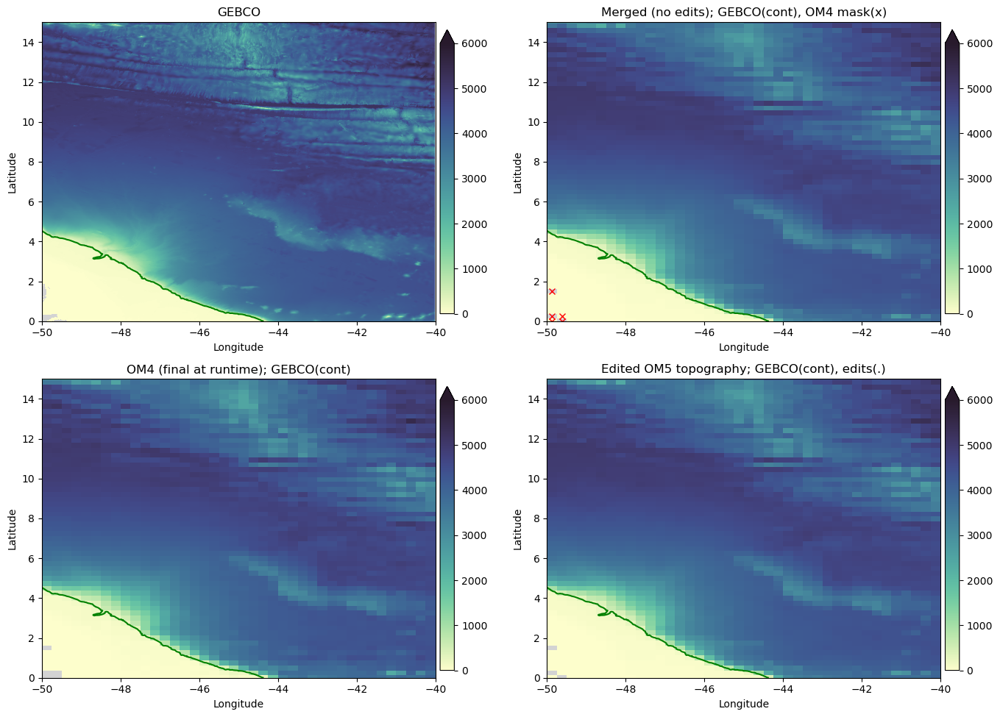

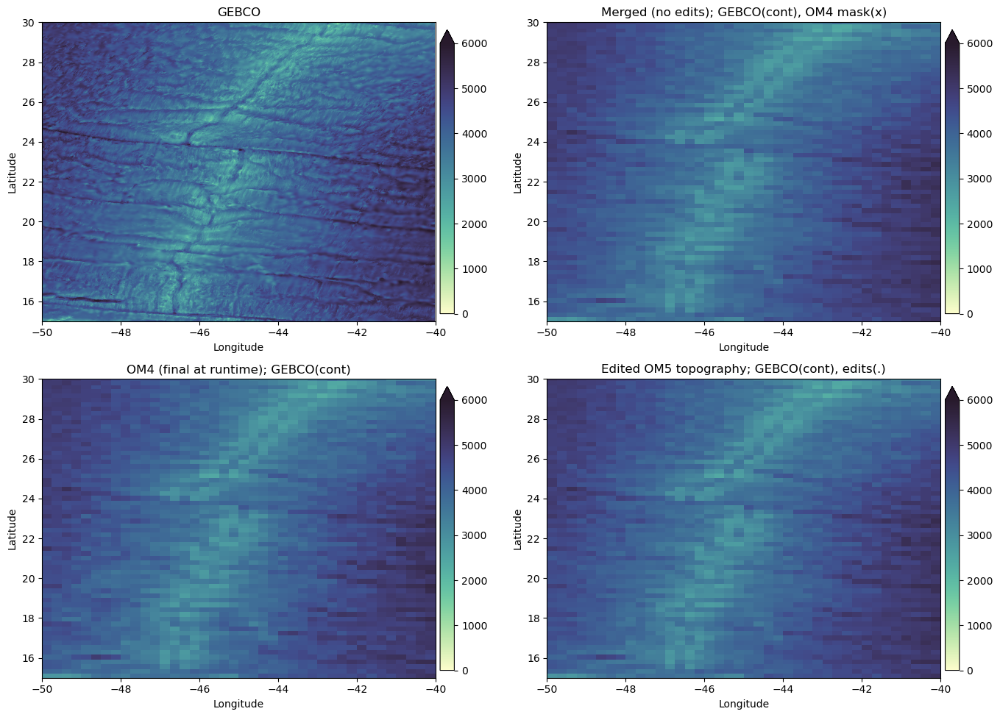

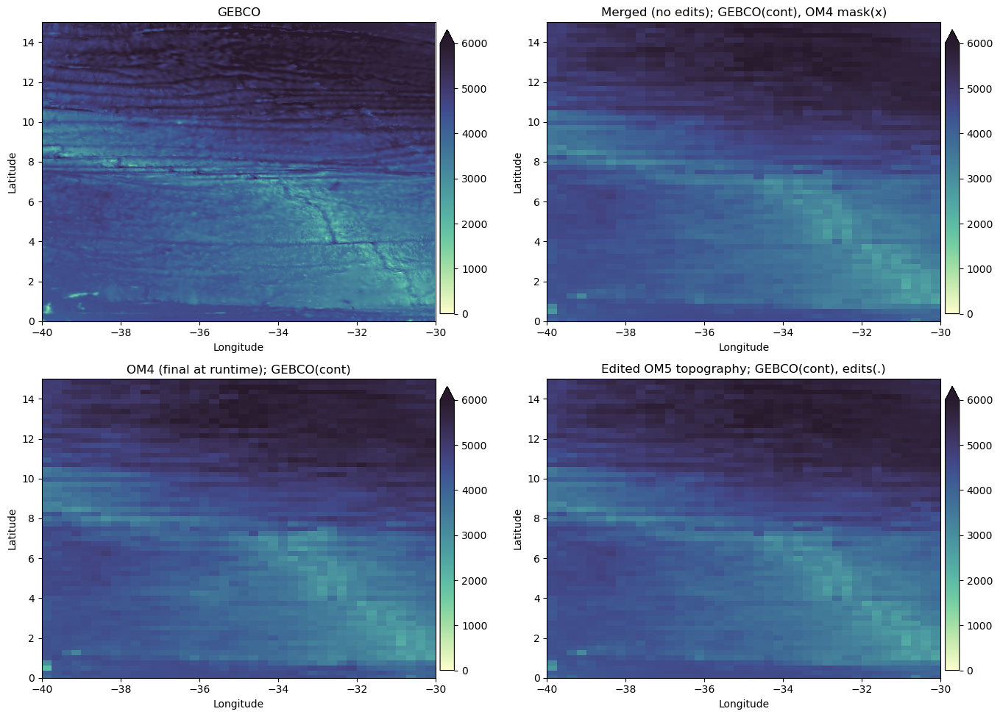

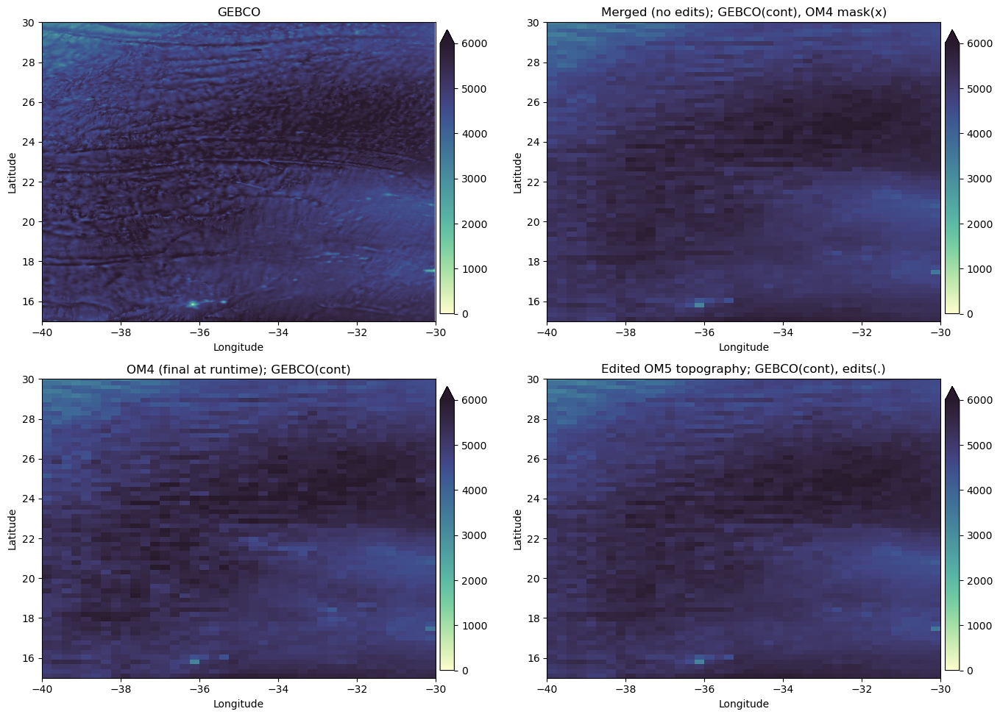

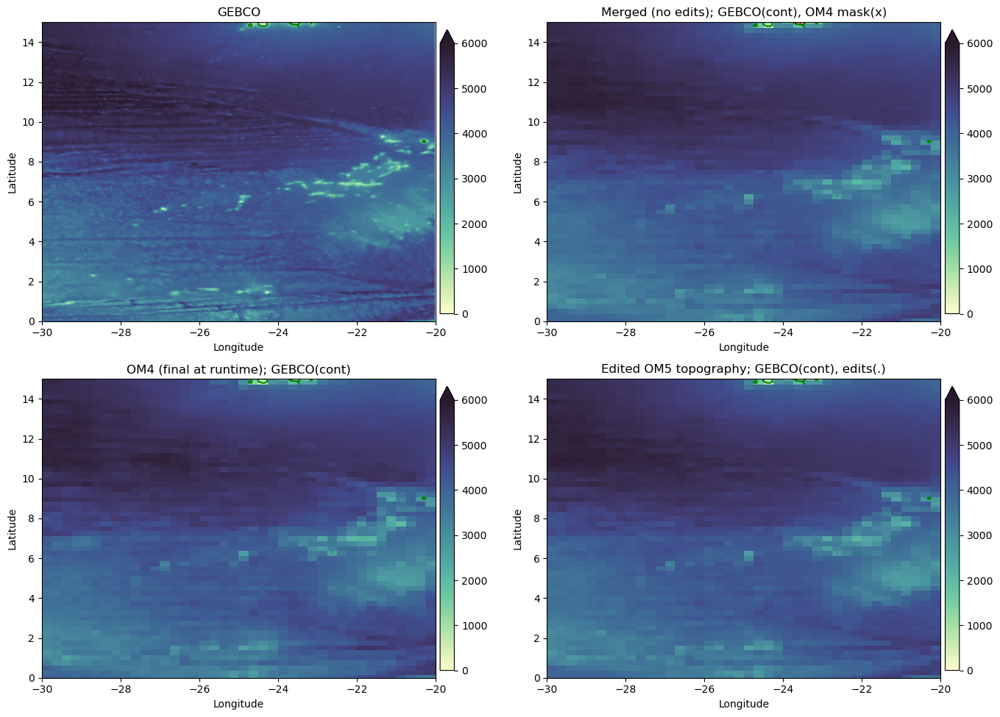

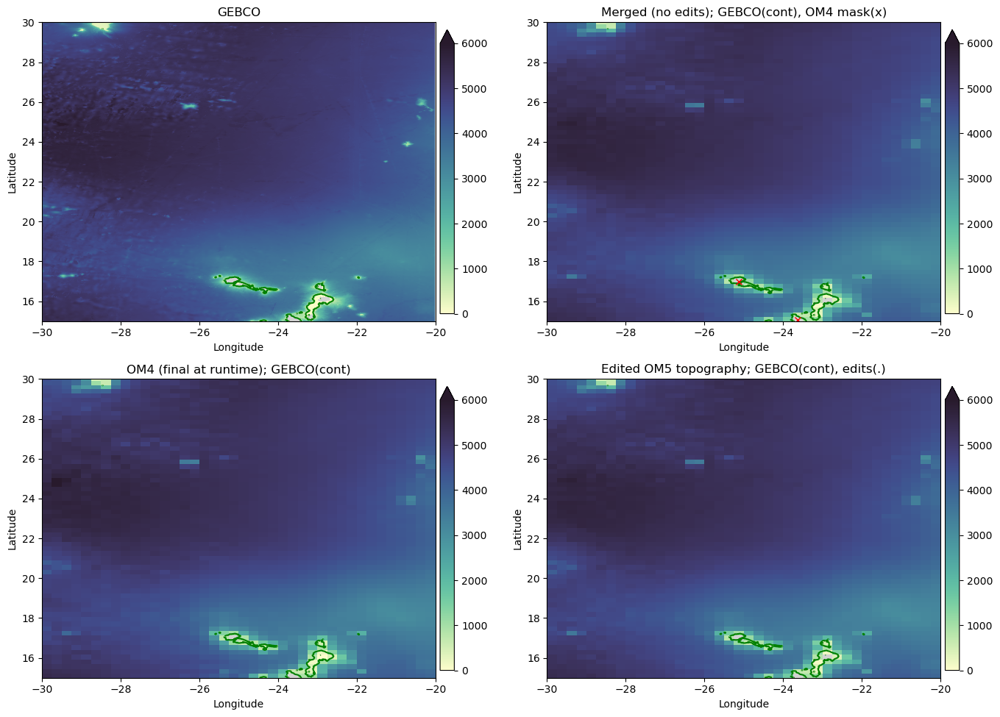

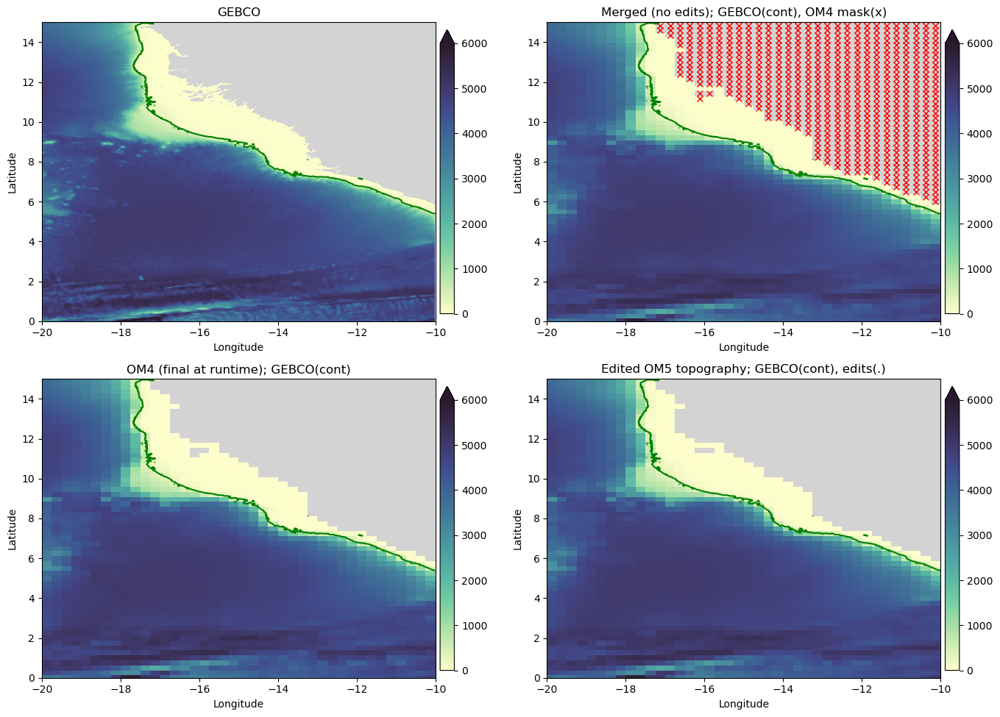

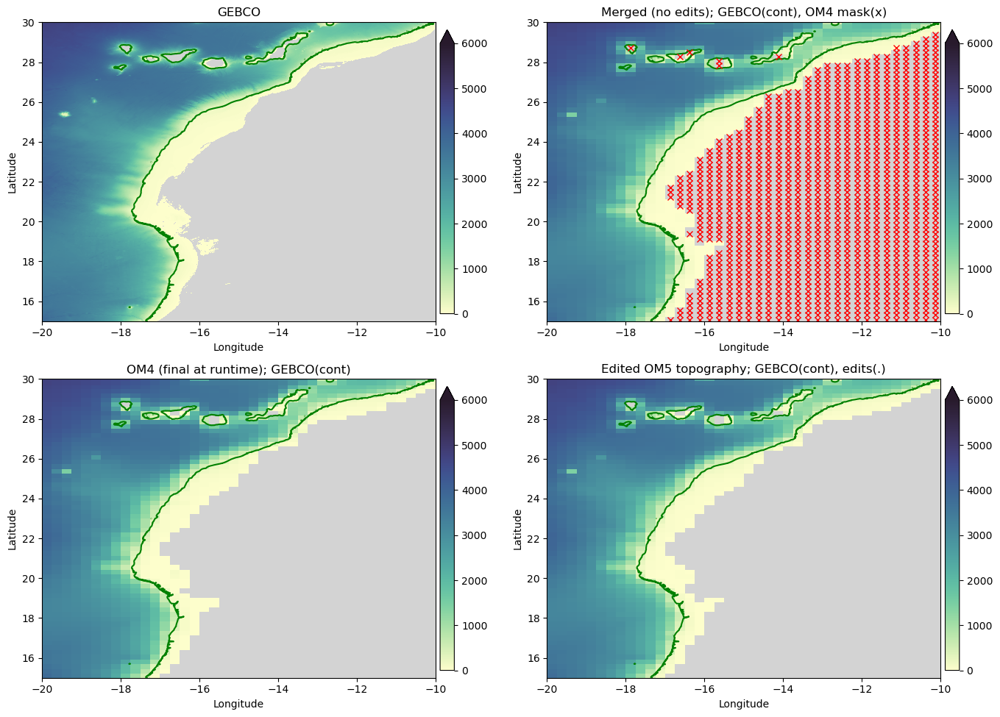

In [8]:
xint = divide_interval(Region_Boundaries[2],Region_Boundaries[3],6)
yint = divide_interval(Region_Boundaries[0],Region_Boundaries[1],2)

depths = [6000, 6000, 6000, 6000, 6000, 6000, 6000, 6000]

count = 0
for nx,xrng in enumerate(xint):
    for ny, yrng in enumerate(yint):
        print(xrng)
        try:
            region = Region(xrng[0], yrng[0], width_lon=xrng[1], width_lat=yrng[1])
            map_region(region, 0, depths[count], GEBCO, OM4, OM5, '', gebco_contours=[250],text_depths=False)
            count+=1
        except:
            pass

Gebco (js:je,is:ie) = 27839:28799,67752:68952
OM4 model (js:je,is:ie) = 610:630,1128:1150
OM5 model (js:je,is:ie) = 691:711,1128:1150
Using xlim = (-17.7, -12.7) ylim = (26.0, 30.0)


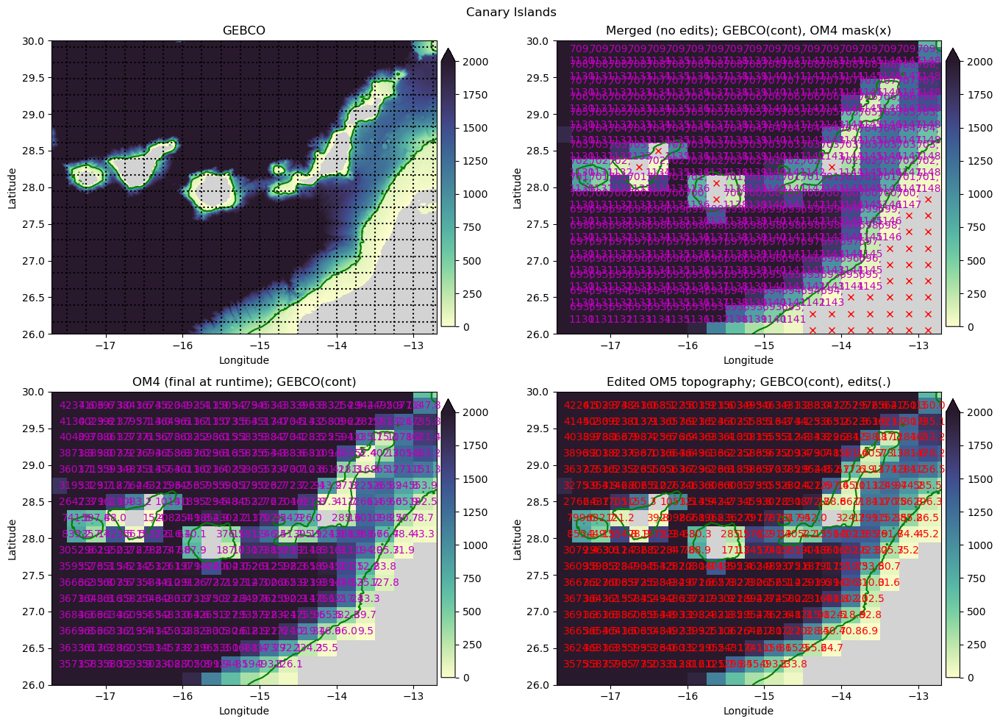

In [9]:
# Check Canary Islands

region = Region(-15.2, 28, width_lon=5, width_lat=4)
map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Canary Islands', gebco_contours=[250] )

Gebco (js:je,is:ie) = 28259:28739,68399:68879
OM4 model (js:je,is:ie) = 618:629,1138:1148
OM5 model (js:je,is:ie) = 699:710,1138:1148
Using xlim = (-15.0, -13.0) ylim = (27.75, 29.75)


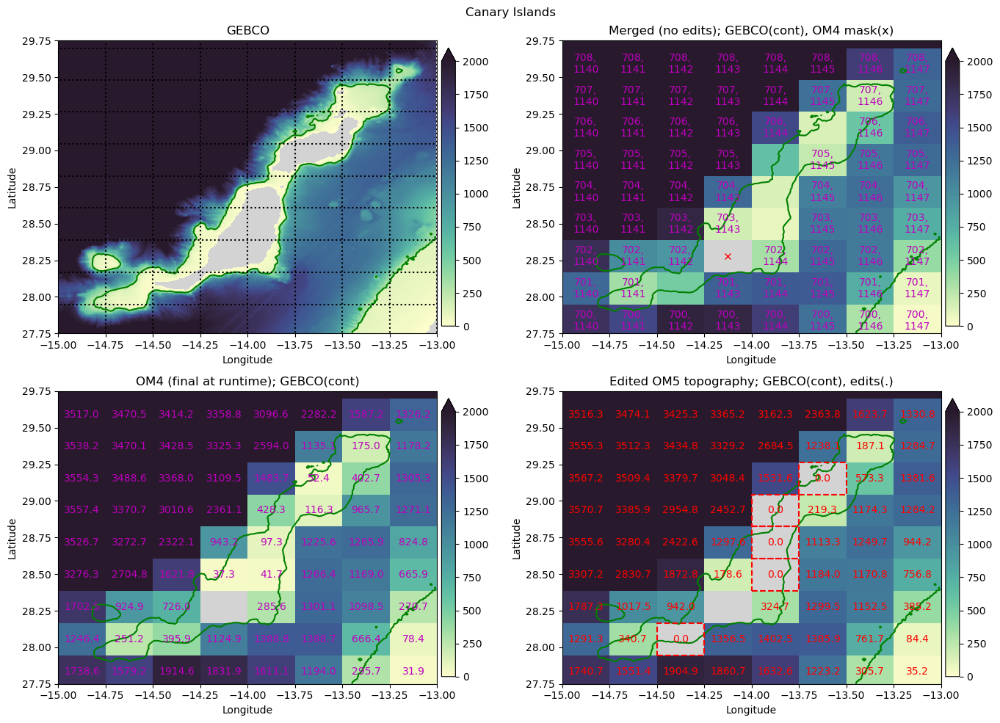

In [10]:
# Check Canary Islands
##  Probably needs a channel!!!

region = Region(-14, 28.75, width_lon=2, width_lat=2)

OM5.reset(region)
OM5.depth[701,1142] = 0
OM5.depth[703,1144] = 0
OM5.depth[704,1144] = 0
OM5.depth[705,1144] = 0
OM5.depth[706,1145] = 0

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Canary Islands', gebco_contours=[250] )

Gebco (js:je,is:ie) = 25019:25859,65819:66659
OM4 model (js:je,is:ie) = 560:576,1095:1111
OM5 model (js:je,is:ie) = 641:657,1095:1111
Using xlim = (-25.75, -22.25) ylim = (14.25, 17.75)


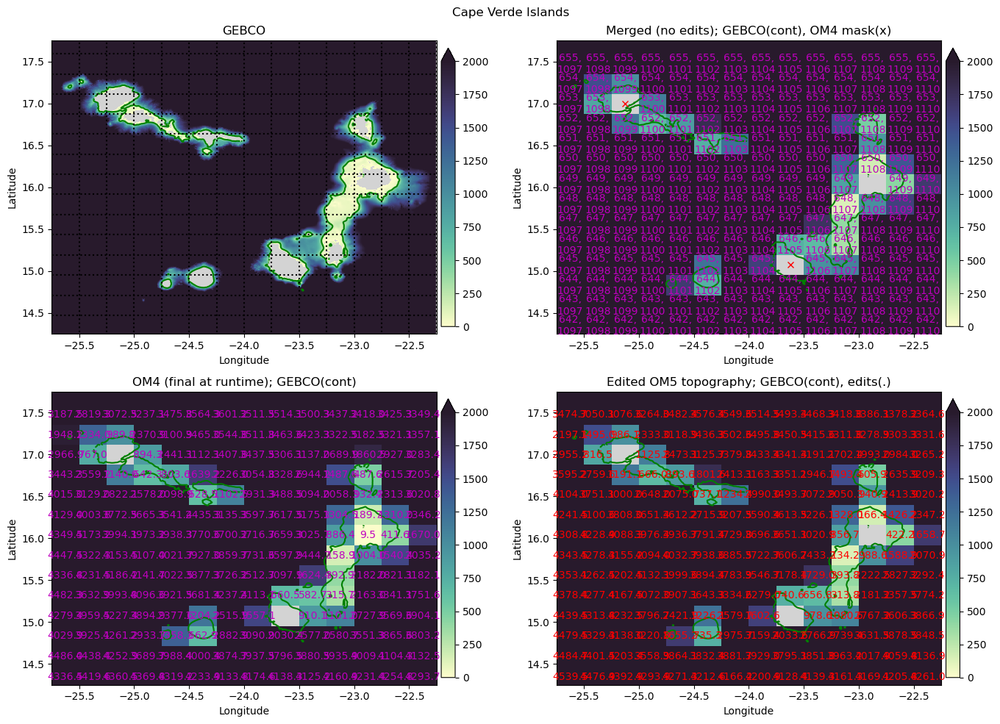

In [11]:
# Check Cape Verde Islands

region = Region(-24, 16, width_lon=3.5, width_lat=3.5)
map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Cape Verde Islands', gebco_contours=[250] )

Gebco (js:je,is:ie) = 25104:25584,66179:66659
OM4 model (js:je,is:ie) = 561:571,1101:1111
OM5 model (js:je,is:ie) = 642:652,1101:1111
Using xlim = (-24.25, -22.25) ylim = (14.6, 16.6)


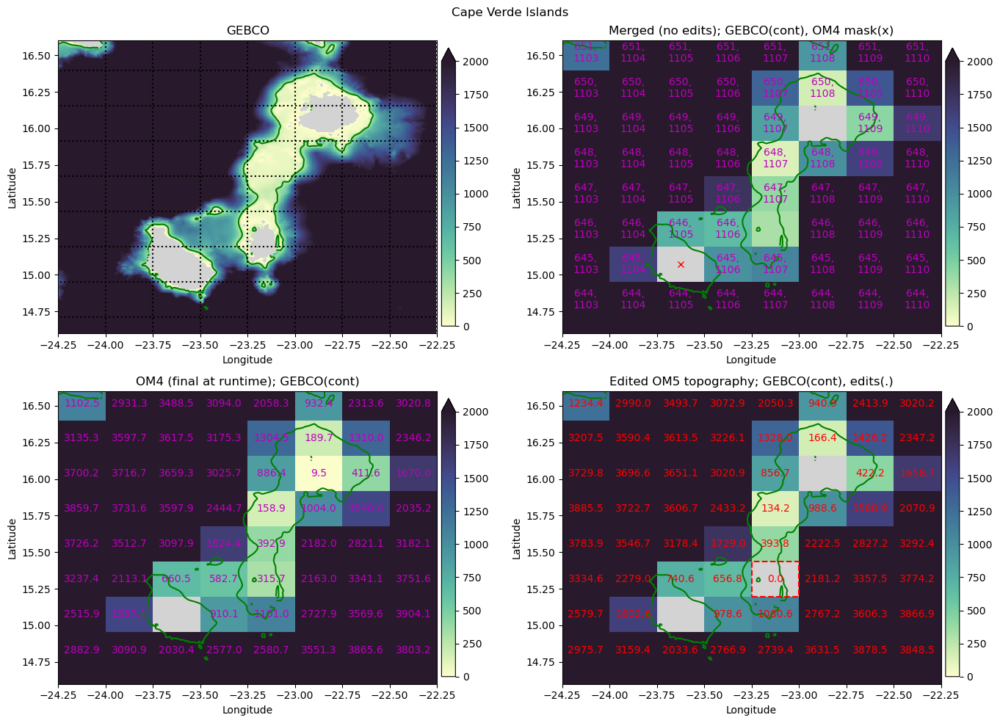

In [12]:
# Check Cape Verde Islands

region = Region(-23.25, 15.6, width_lon=2, width_lat=2)

OM5.depth[646,1107] = 0.

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Cape Verde Islands', gebco_contours=[250] )

Gebco (js:je,is:ie) = 24959:25439,65879:66359
OM4 model (js:je,is:ie) = 559:569,1096:1106
OM5 model (js:je,is:ie) = 640:650,1096:1106
Using xlim = (-25.5, -23.5) ylim = (14.0, 16.0)


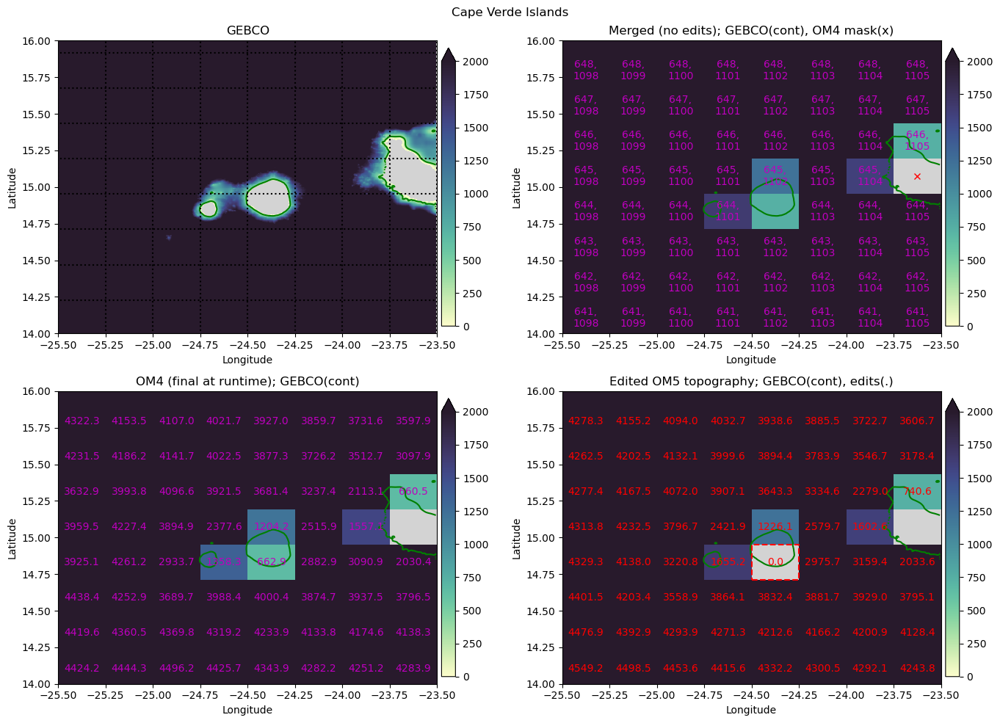

In [13]:
# Check Cape Verde Islands

region = Region(-24.5, 15.0, width_lon=2, width_lat=2)

OM5.depth[644,1102] = 0.

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Cape Verde Islands', gebco_contours=[250] )

Gebco (js:je,is:ie) = 21479:22679,73379:74579
OM4 model (js:je,is:ie) = 500:522,1221:1243
OM5 model (js:je,is:ie) = 581:603,1221:1243
Using xlim = (5.75, 10.75) ylim = (-0.5, 4.5)


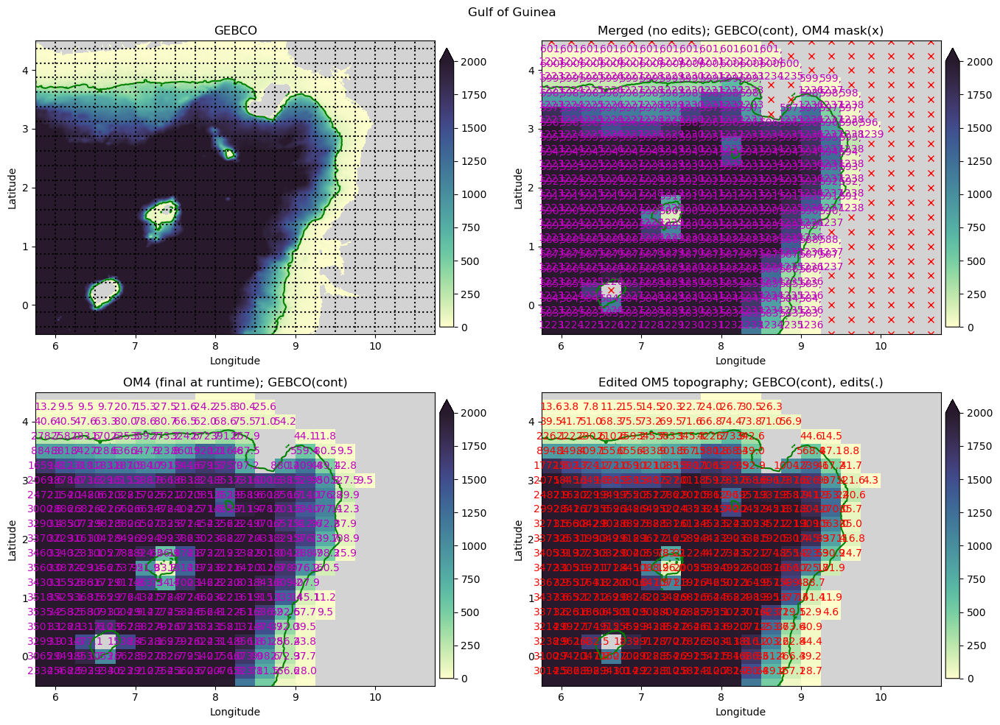

In [14]:
# Check Gulf of Guinea

region = Region(8.25, 2, width_lon=5, width_lat=5)

OM5.depth[644,1102] = 0.

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Gulf of Guinea', gebco_contours=[250] )

Gebco (js:je,is:ie) = 22199:22679,73799:74279
OM4 model (js:je,is:ie) = 512:522,1228:1238
OM5 model (js:je,is:ie) = 593:603,1228:1238
Using xlim = (7.5, 9.5) ylim = (2.5, 4.5)


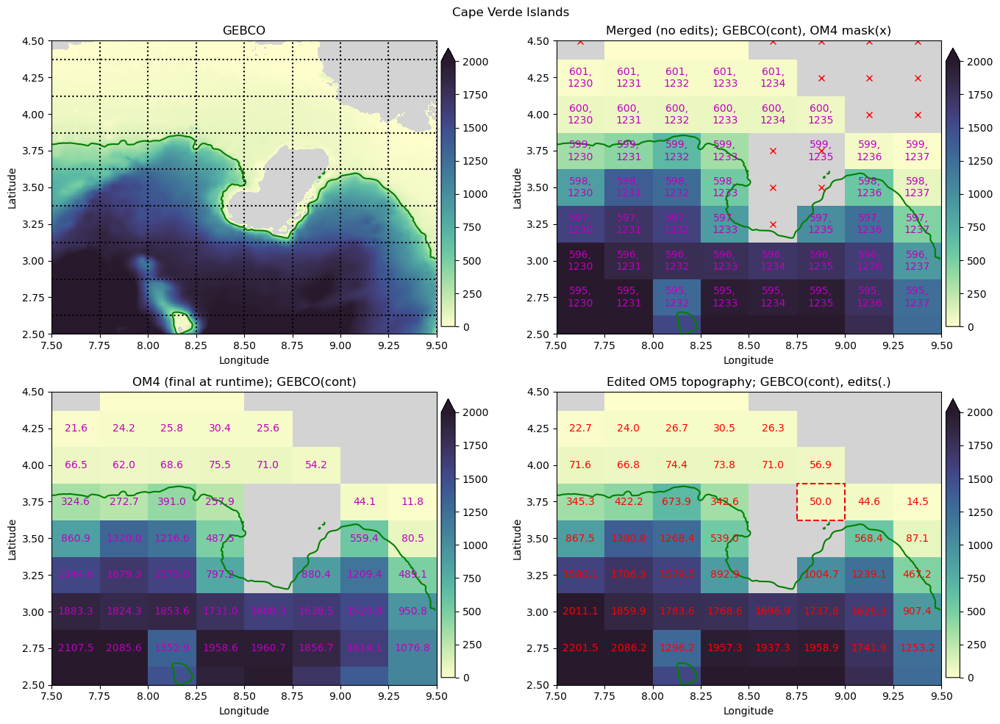

In [15]:
# Check Gulf of Guinea

region = Region(8.5, 3.5, width_lon=2, width_lat=2)

OM5.depth[599,1235] = 50.

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Cape Verde Islands', gebco_contours=[250] )

Gebco (js:je,is:ie) = 21719:22199,73559:74039
OM4 model (js:je,is:ie) = 504:514,1224:1234
OM5 model (js:je,is:ie) = 585:595,1224:1234
Using xlim = (6.5, 8.5) ylim = (0.5, 2.5)


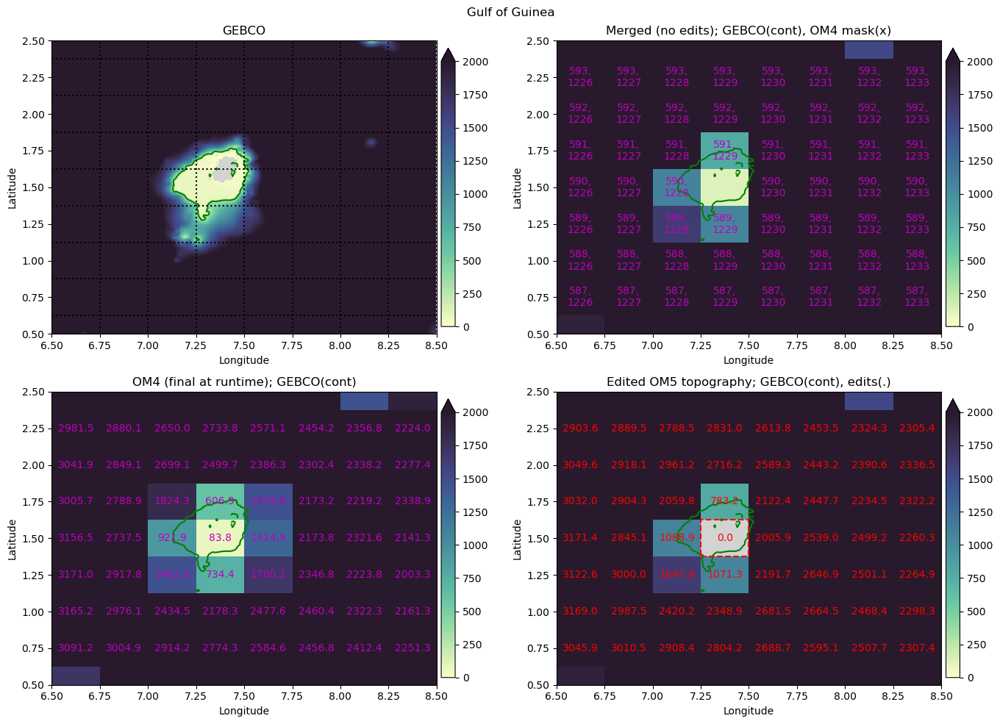

In [16]:
# Check Gulf of Guinea

region = Region(7.5, 1.5, width_lon=2, width_lat=2)

OM5.depth[590,1229] = 0.

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Gulf of Guinea', gebco_contours=[250] )

In [17]:
OM5.write_nc("om5_topo_edits_region_16.nc")

New Depth at jEdit=590 iEdit=1229 set to 0.0
New Depth at jEdit=599 iEdit=1235 set to 50.0
New Depth at jEdit=644 iEdit=1102 set to 0.0
New Depth at jEdit=646 iEdit=1107 set to 0.0
New Depth at jEdit=701 iEdit=1142 set to 0.0
New Depth at jEdit=703 iEdit=1144 set to 0.0
New Depth at jEdit=704 iEdit=1144 set to 0.0
New Depth at jEdit=705 iEdit=1144 set to 0.0
New Depth at jEdit=706 iEdit=1145 set to 0.0
NetCDF file 'om5_topo_edits_region_16.nc' written successfully.
